# Fraud - 04

In [1]:
import numpy as np
import pandas as pd
import pymc3 as pm
import arviz as az
from plotnine import *
import plotnine as p9
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress
import xarray as xr
from fitter import Fitter

%matplotlib inline

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

theme_set(theme_bw())
sns.set_theme(style='white')
pd.set_option('display.max_columns', 100)
xr.set_options(display_expand_data=False, display_expand_attrs=False, display_expand_coords=False,
              display_expand_data_vars=False)
SEED = 1925

%load_ext watermark
%watermark --iversions

arviz     : 0.11.2
matplotlib: 3.4.3
seaborn   : 0.11.2
xarray    : 0.19.0
pymc3     : 3.11.4
plotnine  : 0.8.0
pandas    : 1.3.2
numpy     : 1.19.5



# Data

## Data Generating Process

In [3]:
n_observations = 250

true_orange_mu, true_orange_sd = 300, 100
true_green_mu, true_green_sd = 600, 200

# Fraction of each class that will be observed.
obs_pct_orange_mu, obs_pct_orange_sd = 0.10, 0.05
obs_pct_green_mu, obs_pct_green_sd = 0.40, 0.10



df = pd.DataFrame(
    dict(
        true_orange=np.random.normal(true_orange_mu, true_orange_sd, size=n_observations),
        true_green=np.random.normal(true_green_mu, true_green_sd, size=n_observations),
        pct_obs_orange=np.random.normal(obs_pct_orange_mu, obs_pct_orange_sd, size=n_observations),
        pct_obs_green=np.random.normal(obs_pct_green_mu, obs_pct_green_sd, size=n_observations),
    ),
    columns=['true_orange', 'true_green', 'pct_obs_orange', 'pct_obs_green']
)
df['total'] = df['true_orange'] + df['true_green']
df['obs_orange'] = df['true_orange'] * df['pct_obs_orange'].clip(lower=0)
df['obs_green'] = df['true_green'] * df['pct_obs_green'].clip(lower=0)

df.drop(['pct_obs_orange', 'pct_obs_green'], axis=1, inplace=True)
df = df.round()
df

,true_orange,true_green,total,obs_orange,obs_green
0,331.0,402.0,733.0,28.0,138.0
1,211.0,521.0,733.0,18.0,167.0
2,517.0,407.0,924.0,87.0,166.0
3,293.0,440.0,733.0,45.0,180.0
4,172.0,402.0,575.0,0.0,174.0
...,...,...,...,...,...
245,370.0,755.0,1126.0,51.0,244.0
246,284.0,834.0,1119.0,16.0,292.0
247,298.0,536.0,833.0,18.0,166.0
248,205.0,490.0,694.0,0.0,173.0


## Data generation using pymc distributions

In [4]:
n_observations = 250

true_orange_mu, true_orange_sd = 300, 100
true_green_mu, true_green_sd = 600, 200

# Fraction of each class that will be observed.
obs_pct_orange_mu, obs_pct_orange_sd = 0.10, 0.05
obs_pct_green_mu, obs_pct_green_sd = 0.40, 0.10

true_orange=pm.TruncatedNormal.dist(true_orange_mu, true_orange_sd, lower=0).random(size=n_observations)
true_orange = [int(x) for x in true_orange]
true_green=pm.TruncatedNormal.dist(true_green_mu, true_green_sd, lower=0).random(size=n_observations)
true_green = [int(x) for x in true_green]
pct_obs_orange=pm.TruncatedNormal.dist(obs_pct_orange_mu, obs_pct_orange_sd, lower=0).random(size=n_observations)
pct_obs_green=pm.TruncatedNormal.dist(obs_pct_green_mu, obs_pct_green_sd, lower=0).random(size=n_observations)

df = pd.DataFrame({'day': range(n_observations), 'true_orange': true_orange, 'true_green': true_green, 'pct_obs_orange': pct_obs_orange, 'pct_obs_green':pct_obs_green})

df['total'] = df['true_orange'] + df['true_green']
df['obs_orange'] = (df['true_orange'] * df['pct_obs_orange']).astype(int)
df['obs_green'] = (df['true_green'] * df['pct_obs_green']).astype(int)
df['obs_greenorange'] = df['obs_green'] + df['obs_orange']

# df.drop(['pct_obs_orange', 'pct_obs_green'], axis=1, inplace=True)
# df = df.round()
df

,day,true_orange,true_green,pct_obs_orange,pct_obs_green,total,obs_orange,obs_green,obs_greenorange
0,0,364,420,0.125774,0.514874,784,45,216,261
1,1,267,484,0.092298,0.270518,751,24,130,154
2,2,329,723,0.079084,0.462034,1052,26,334,360
3,3,403,534,0.115705,0.305706,937,46,163,209
4,4,190,667,0.115651,0.512590,857,21,341,362
...,...,...,...,...,...,...,...,...,...
245,245,378,594,0.068791,0.459711,972,26,273,299
246,246,259,771,0.051670,0.372907,1030,13,287,300
247,247,250,505,0.105722,0.302323,755,26,152,178
248,248,450,748,0.099562,0.370459,1198,44,277,321


# Data Relationships

In [5]:
df.describe()

,day,true_orange,true_green,pct_obs_orange,pct_obs_green,total,obs_orange,obs_green,obs_greenorange
count,250.000000,250.000000,250.000000,250.000000,250.000000,250.000000,250.000000,250.000000,250.00000
mean,124.500000,307.588000,606.176000,0.103305,0.402235,913.764000,31.376000,243.600000,274.97600
std,72.312977,98.221342,177.578607,0.046351,0.094915,199.130268,18.066216,93.159448,95.54027
min,0.000000,50.000000,182.000000,0.005823,0.149783,464.000000,1.000000,55.000000,86.00000
25%,62.250000,232.250000,489.000000,0.067235,0.335829,784.000000,18.000000,172.250000,207.00000
50%,124.500000,308.000000,601.000000,0.104970,0.406600,905.000000,29.000000,237.000000,271.00000
75%,186.750000,378.750000,722.750000,0.133012,0.466447,1036.750000,42.750000,300.000000,329.75000
max,249.000000,527.000000,1133.000000,0.218236,0.675492,1499.000000,97.000000,665.000000,707.00000


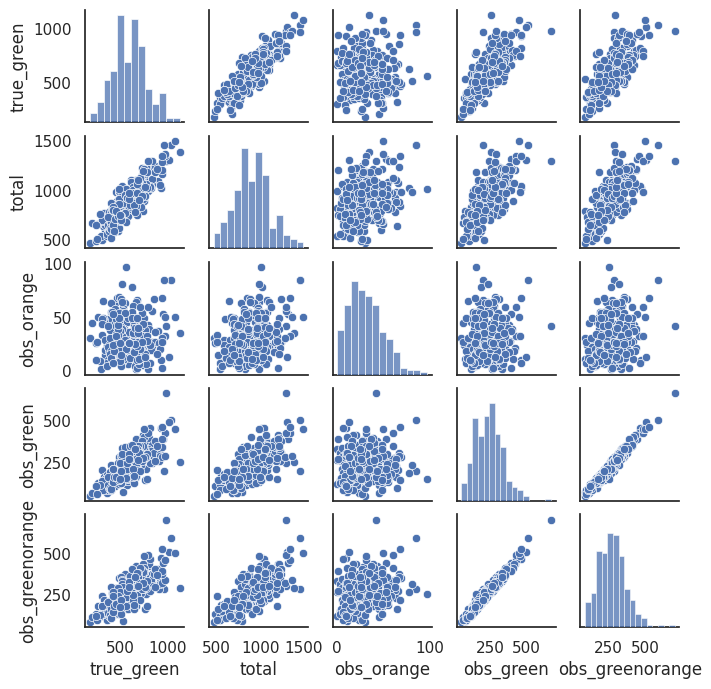

In [6]:
sns.pairplot(df[['true_green', 'total', 'obs_orange', 'obs_green', 'obs_greenorange']], height=1.4);

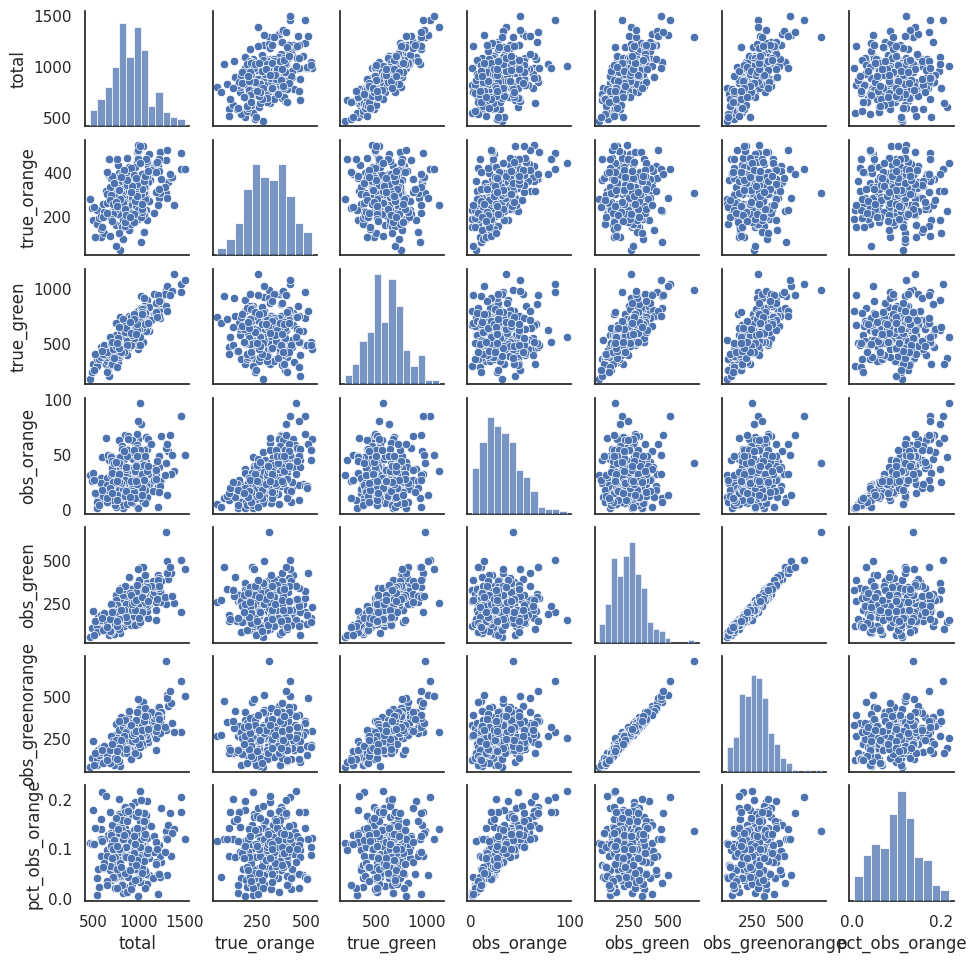

In [7]:
sns.pairplot(df[['total', 'true_orange', 'true_green', 'obs_orange', 'obs_green', 'obs_greenorange', 'pct_obs_orange']], height=1.4);

Day 0 Counts
day                  0.000000
true_orange        364.000000
true_green         420.000000
pct_obs_orange       0.125774
pct_obs_green        0.514874
total              784.000000
obs_orange          45.000000
obs_green          216.000000
obs_greenorange    261.000000
Name: 0, dtype: float64


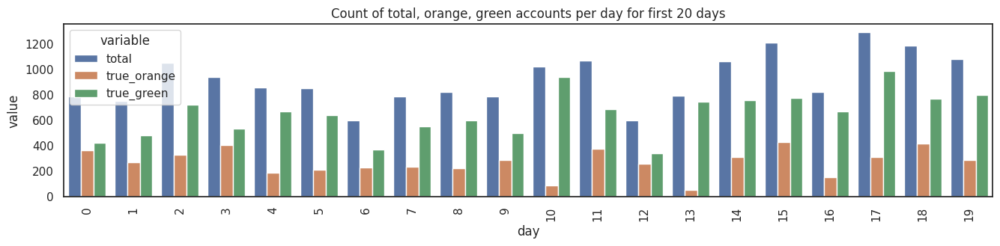

In [8]:
print(f'Day 0 Counts\n{df.loc[0]}')
fig, ax = plt.subplots(figsize=(16, 3))
data_len = 20
sns.barplot(x='day', y='value', ax=ax, hue='variable', dodge=True, data=pd.melt(df[['day', 'total', 'true_orange', 'true_green']][0:data_len], ['day']), alpha=1.0);
ax.set_title(f'Count of total, orange, green accounts per day for first {data_len} days')
plt.xticks(rotation=90)
plt.show();

Day 0 Counts
day                  0.000000
true_orange        364.000000
true_green         420.000000
pct_obs_orange       0.125774
pct_obs_green        0.514874
total              784.000000
obs_orange          45.000000
obs_green          216.000000
obs_greenorange    261.000000
Name: 0, dtype: float64


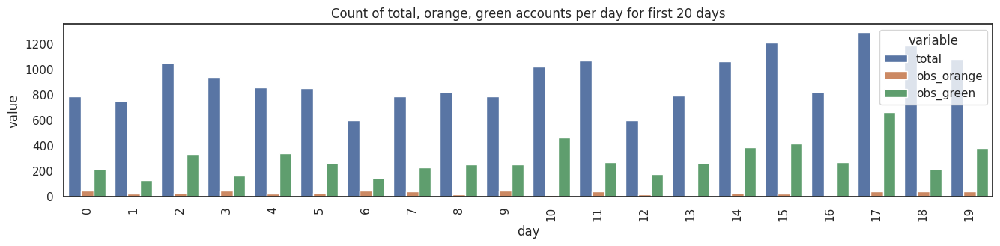

In [9]:
print(f'Day 0 Counts\n{df.loc[0]}')
fig, ax = plt.subplots(figsize=(16, 3))
data_len = 20
sns.barplot(x='day', y='value', ax=ax, hue='variable', dodge=True, data=pd.melt(df[['day', 'total', 'obs_orange', 'obs_green']][0:data_len], ['day']), alpha=1.0);
ax.set_title(f'Count of total, orange, green accounts per day for first {data_len} days')
plt.xticks(rotation=90)
plt.show();

# Model
## Strategy
+ 

In [10]:
dfm = df.copy()
dfm = dfm[['day', 'total', 'obs_orange', 'obs_green', 'true_green']]
dfm

,day,total,obs_orange,obs_green,true_green
0,0,784,45,216,420
1,1,751,24,130,484
2,2,1052,26,334,723
3,3,937,46,163,534
4,4,857,21,341,667
...,...,...,...,...,...
245,245,972,26,273,594
246,246,1030,13,287,771
247,247,755,26,152,505
248,248,1198,44,277,748


In [11]:
# dfm_std = dfm.copy()
# dfm_std['obs_orange'] = (dfm_std['obs_orange'] - dfm_std['obs_orange'].mean()) / dfm_std['obs_orange'].std()
# dfm_std['obs_green'] = (dfm_std['obs_green'] - dfm_std['obs_green'].mean()) / dfm_std['obs_green'].std()
# dfm_std['true_green'] = (dfm_std['true_green'] - dfm_std['true_green'].mean()) / dfm_std['true_green'].std()
# dfm_std['total'] = (dfm_std['total'] - dfm_std['total'].mean()) / dfm_std['total'].std()
# dfm_std

In [12]:
# sns.pairplot(dfm_std, height=1.75);

In [13]:
# TODO - Write model in forward mode and take a look at values
# Start by recovering modeling true green

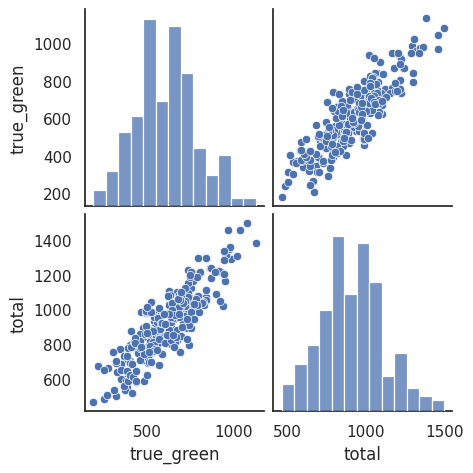

In [14]:
sns.pairplot(dfm[['true_green', 'total']], height=2.4)
# plt.grid()
plt.show();

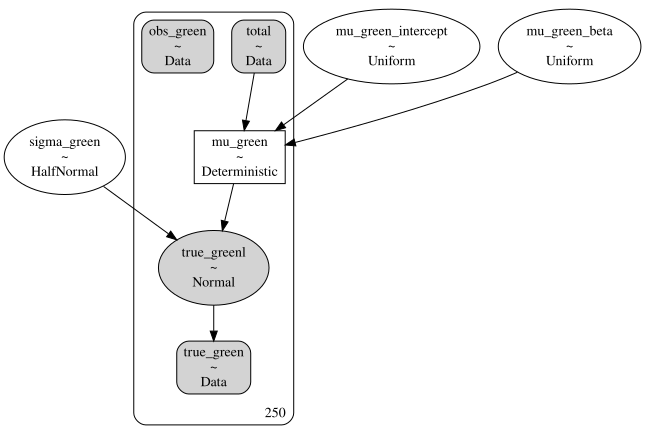

In [15]:
with pm.Model() as model1:
    # data
    obs_total = pm.Data('total', dfm['total'].values)
    obs_green = pm.Data('obs_green', dfm['obs_green'].values)
    true_green = pm.Data('true_green', dfm['true_green'].values)
    
    # Priors for linear relationship between true green and total 
    mu_green_intercept = pm.Uniform('mu_green_intercept', -200, 200)
    mu_green_beta = pm.Uniform('mu_green_beta', 0, 2)    
    sigma_green = pm.HalfNormal('sigma_green', 3)
    # Linear relationship between true green and total
    mu_green = pm.Deterministic('mu_green', mu_green_intercept + mu_green_beta * obs_total)
    true_greenl = pm.Normal('true_greenl', mu_green, sigma_green, observed=true_green)
    
#     # Priors for relationship between obs_green and true_green
#     obs_green_intercept = pm.Uniform('obs_green_intercept', -0.5, 0.5)
#     obs_green_beta = pm.Uniform('obs_green_beta', -2, 2)
#     sigma_obs_green = pm.HalfNormal('sigma_obs_green', 1)
#     # Process
#     mu_obs_green = obs_green_intercept + obs_green_beta * true_green
#     obs_greenl = pm.Normal('obs_greenl', mu_obs_green, sigma_obs_green, observed=obs_green)
    
    prior = pm.sample_prior_predictive()
    idata_model1 = az.from_pymc3(prior=prior)
    # trace = pm.sample()
    # idata_model1 = az.from_pymc3(trace=trace)
pm.model_to_graphviz(model1) 

In [16]:
idata_model1

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data

In [17]:
with model1:
    trace = pm.sample(tune=2000, return_inferencedata=False)
    post = pm.sample_posterior_predictive(trace)
    idata_model1.extend(az.from_pymc3(trace=trace, posterior_predictive=post))    

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma_green, mu_green_beta, mu_green_intercept]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 6 seconds.
The acceptance probability does not match the target. It is 0.8802370978922132, but should be close to 0.8. Try to increase the number of tuning steps.


In [18]:
idata_model1

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> constant_data

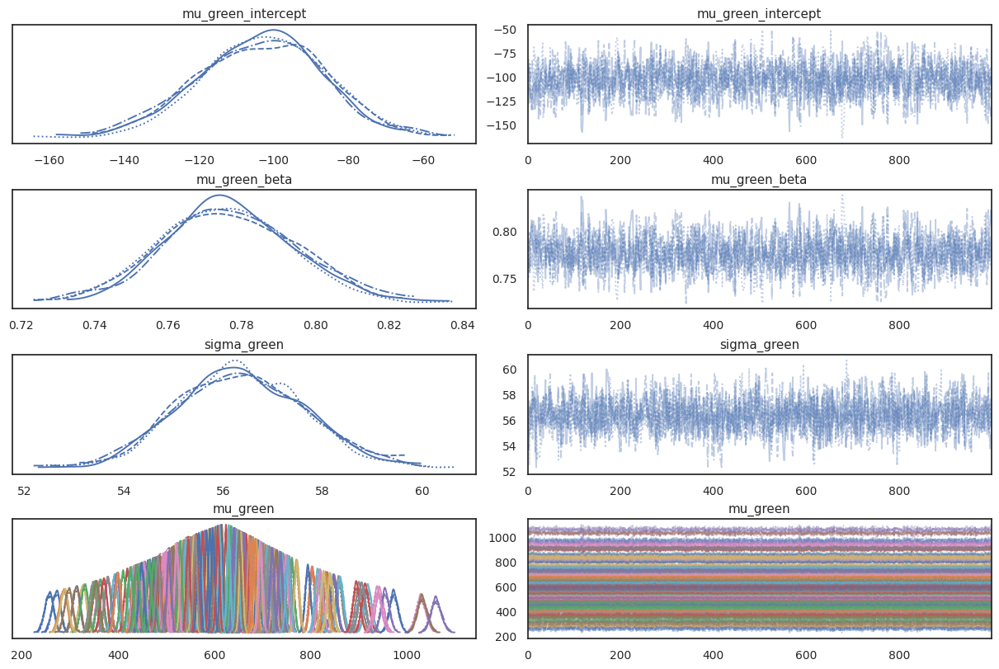

In [19]:
az.plot_trace(idata_model1.posterior);

In [20]:
summ = az.summary(idata_model1.posterior_predictive).reset_index(drop=True)
df_posterior_check = pd.concat([summ, dfm], axis=1)
df_posterior_check

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,day,total,obs_orange,obs_green,true_green
0,506.655,56.266,398.069,608.525,0.877,0.622,4107.0,4103.0,1.0,0,784,45,216,420
1,479.483,55.917,378.146,583.716,0.925,0.655,3655.0,3677.0,1.0,1,751,24,130,484
2,712.982,56.712,612.706,824.227,0.927,0.656,3744.0,3689.0,1.0,2,1052,26,334,723
3,623.669,56.947,522.301,735.537,0.920,0.651,3826.0,4054.0,1.0,3,937,46,163,534
4,561.307,56.330,454.551,664.744,0.898,0.635,3935.0,3858.0,1.0,4,857,21,341,667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,651.573,55.749,547.699,754.389,0.877,0.622,4037.0,3750.0,1.0,245,972,26,273,594
246,695.573,55.847,585.726,796.044,0.887,0.627,3967.0,3867.0,1.0,246,1030,13,287,771
247,481.157,56.134,374.009,588.027,0.866,0.612,4214.0,3845.0,1.0,247,755,26,152,505
248,826.309,56.273,717.797,924.435,0.895,0.634,3959.0,3574.0,1.0,248,1198,44,277,748


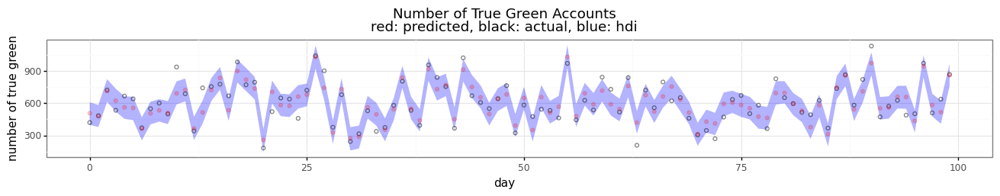

In [21]:
p =(ggplot(df_posterior_check[0:100], aes(x='day')) +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    geom_point(aes(y='true_green'), alpha=0.5, color='black', fill='none') +
    geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(16, 2)) +
    labs(title=f'Number of True Green Accounts\nred: predicted, black: actual, blue: hdi', x='day', y='number of true green')
   )
p.draw();

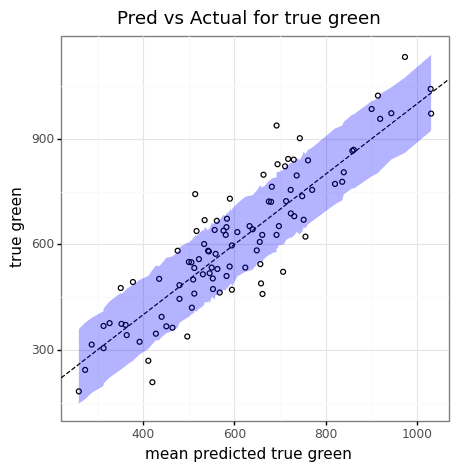

In [22]:
p =(ggplot(df_posterior_check[0:100], aes(x='mean', y='true_green')) +
    geom_point(fill='none') +
    geom_abline(intercept=0, slope=1, linetype='dashed') +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    # geom_point(aes(y='obs_green'), alpha=0.5, color='black') +
    # geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(5, 5)) +
    labs(title=f'Pred vs Actual for true green', x='mean predicted true green', y='true green')
   )
p.draw();

In [23]:
az.loo(idata_model1)

Computed from 4000 by 250 log-likelihood matrix

         Estimate       SE
elpd_loo -1542.13    25.45
p_loo        5.88        -

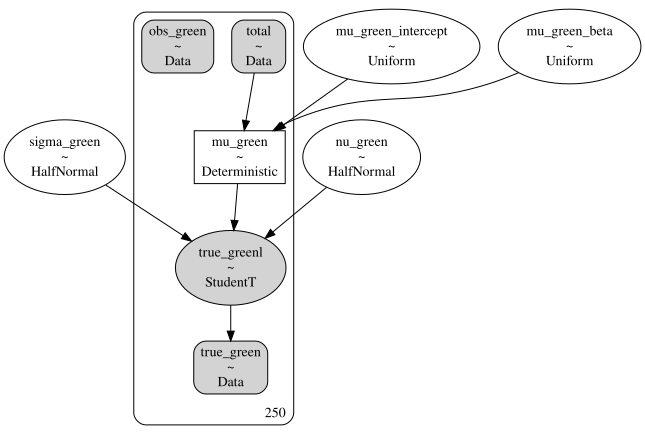

In [24]:
# Change normal to StudentT distribution + new prior for nu
with pm.Model() as model2:
    # data
    obs_total = pm.Data('total', dfm['total'].values)
    obs_green = pm.Data('obs_green', dfm['obs_green'].values)
    true_green = pm.Data('true_green', dfm['true_green'].values)
    
    # Priors for linear relationship between true green and total 
    mu_green_intercept = pm.Uniform('mu_green_intercept', -200, 200)
    mu_green_beta = pm.Uniform('mu_green_beta', -2, 2)    
    sigma_green = pm.HalfNormal('sigma_green', 1)
    nu_green = pm.HalfNormal('nu_green', 1)
    # Linear relationship between true green and total
    mu_green = pm.Deterministic('mu_green', mu_green_intercept + mu_green_beta * obs_total)
    true_greenl = pm.StudentT('true_greenl', nu_green, mu_green, sigma_green, observed=true_green)
    
#     # Priors for relationship between obs_green and true_green
#     obs_green_intercept = pm.Uniform('obs_green_intercept', -0.5, 0.5)
#     obs_green_beta = pm.Uniform('obs_green_beta', -2, 2)
#     sigma_obs_green = pm.HalfNormal('sigma_obs_green', 1)
#     # Process
#     mu_obs_green = obs_green_intercept + obs_green_beta * true_green
#     obs_greenl = pm.Normal('obs_greenl', mu_obs_green, sigma_obs_green, observed=obs_green)
    
    prior = pm.sample_prior_predictive()
    idata_model2 = az.from_pymc3(prior=prior)
    # trace = pm.sample()
    # idata_model1 = az.from_pymc3(trace=trace)
pm.model_to_graphviz(model2)

In [25]:
with model2:
    trace = pm.sample(return_inferencedata=False)
    post = pm.sample_posterior_predictive(trace)
    idata_model2.extend(az.from_pymc3(trace=trace, posterior_predictive=post))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu_green, sigma_green, mu_green_beta, mu_green_intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 5 seconds.


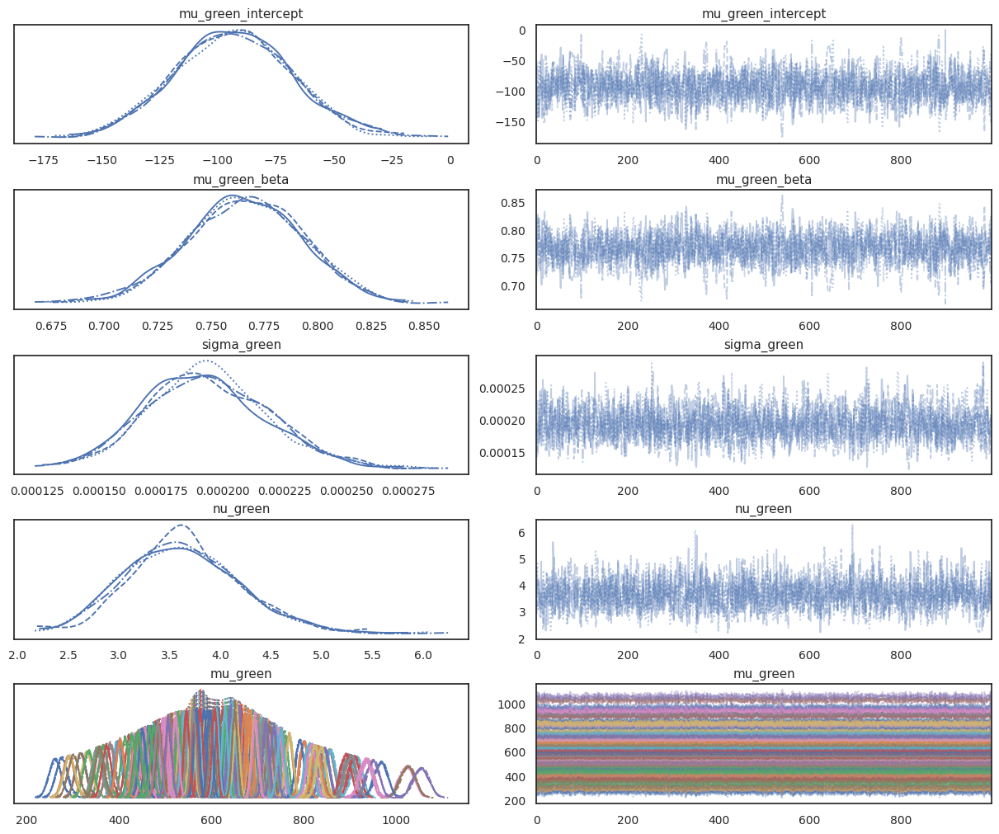

In [26]:
az.plot_trace(idata_model2.posterior);

In [27]:
az.summary(idata_model2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_green_intercept,-93.170,25.156,-139.873,-46.177,0.633,0.448,1601.0,1046.0,1.0
mu_green_beta,0.766,0.027,0.715,0.815,0.001,0.000,1576.0,1073.0,1.0
sigma_green,0.000,0.000,0.000,0.000,0.000,0.000,1716.0,1809.0,1.0
nu_green,3.631,0.555,2.595,4.666,0.013,0.009,1742.0,1684.0,1.0
mu_green[0],507.360,6.582,494.999,519.614,0.136,0.096,2333.0,2555.0,1.0
...,...,...,...,...,...,...,...,...,...
mu_green[245],651.365,5.867,641.135,663.179,0.106,0.075,3042.0,3245.0,1.0
mu_green[246],695.791,6.483,682.562,706.802,0.125,0.089,2675.0,2748.0,1.0
mu_green[247],485.147,7.018,471.833,498.107,0.150,0.106,2178.0,2179.0,1.0
mu_green[248],824.476,9.569,806.182,841.681,0.213,0.151,2033.0,1561.0,1.0


In [28]:
summ = az.summary(idata_model2.posterior_predictive).reset_index(drop=True)
df_posterior_check = pd.concat([summ, dfm], axis=1)
df_posterior_check

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,day,total,obs_orange,obs_green,true_green
0,508.400,109.807,316.953,711.066,1.748,1.236,3883.0,3942.0,1.0,0,784,45,216,420
1,482.579,111.188,271.246,667.621,1.766,1.252,3940.0,3813.0,1.0,1,751,24,130,484
2,707.550,107.179,517.346,903.053,1.703,1.204,3979.0,4010.0,1.0,2,1052,26,334,723
3,624.315,112.593,437.463,835.463,1.706,1.213,4448.0,3933.0,1.0,3,937,46,163,534
4,565.154,108.100,387.523,761.900,1.675,1.190,4085.0,3973.0,1.0,4,857,21,341,667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,651.106,111.880,453.155,847.803,1.674,1.194,4344.0,3941.0,1.0,245,972,26,273,594
246,697.733,102.198,505.333,893.725,1.674,1.197,3603.0,4009.0,1.0,246,1030,13,287,771
247,485.132,106.853,279.230,671.661,1.686,1.216,3838.0,3969.0,1.0,247,755,26,152,505
248,826.123,106.647,641.526,1022.117,1.739,1.229,3878.0,3754.0,1.0,248,1198,44,277,748


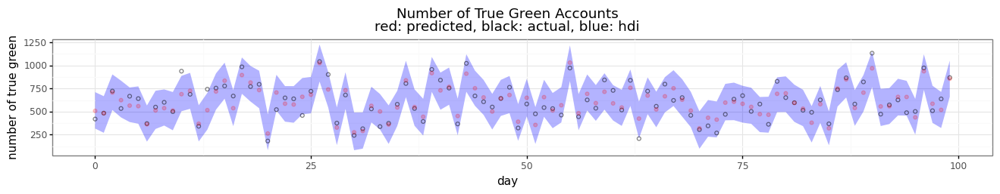

In [29]:
p =(ggplot(df_posterior_check[0:100], aes(x='day')) +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    geom_point(aes(y='true_green'), alpha=0.5, color='black', fill='none') +
    geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(16, 2)) +
    labs(title=f'Number of True Green Accounts\nred: predicted, black: actual, blue: hdi', x='day', y='number of true green')
   )
p.draw();

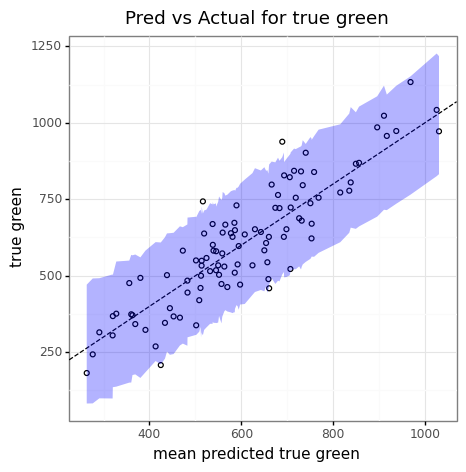

In [30]:
p =(ggplot(df_posterior_check[0:100], aes(x='mean', y='true_green')) +
    geom_point(fill='none') +
    geom_abline(intercept=0, slope=1, linetype='dashed') +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    # geom_point(aes(y='obs_green'), alpha=0.5, color='black') +
    # geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(5, 5)) +
    labs(title=f'Pred vs Actual for true green', x='mean predicted true green', y='true green')
   )
p.draw();

In [31]:
az.loo(idata_model2)

Computed from 4000 by 250 log-likelihood matrix

         Estimate       SE
elpd_loo -1485.04    11.22
p_loo        2.92        -

In [32]:
az_compare = az.compare({'model1': idata_model1, 'model2': idata_model2})
az_compare

/home/david/mambaforge/envs/bmcp/lib/python3.9/site-packages/arviz/stats/stats.py:145: UserWarning: The default method used to estimate the weights for each model,has changed from BB-pseudo-BMA to stacking


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
model2,0,-1485.042186,2.915845,0.000000,1.0,11.217959,0.000000,False,log
model1,1,-1542.131137,5.876946,57.088951,0.0,25.450263,14.675819,False,log


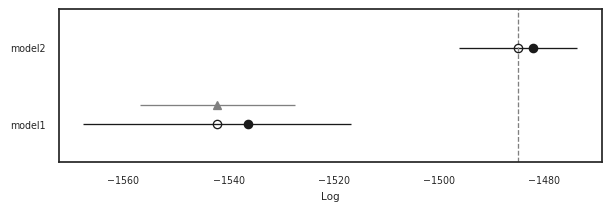

In [33]:
az.plot_compare(az_compare)
plt.show();

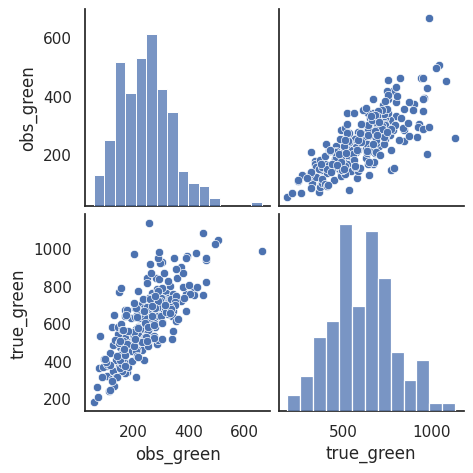

In [34]:
sns.pairplot(dfm[['obs_green', 'true_green']], height=2.4)
# plt.grid()
plt.show();

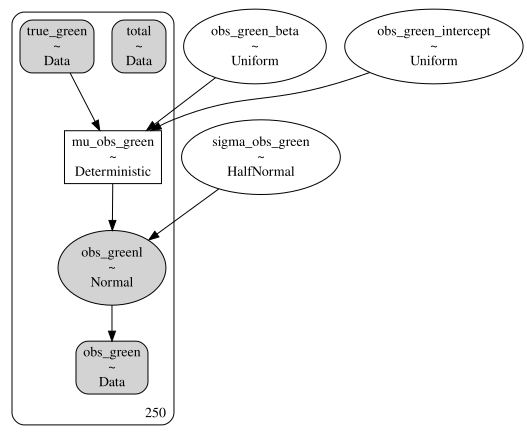

In [35]:
with pm.Model() as model3:
    # data
    obs_total = pm.Data('total', dfm['total'].values)
    obs_green = pm.Data('obs_green', dfm['obs_green'].values)
    true_green = pm.Data('true_green', dfm['true_green'].values)
    
    # # Priors for linear relationship between true green and total 
    # mu_green_intercept = pm.Uniform('mu_green_intercept', -0.5, 0.5)
    # mu_green_beta = pm.Uniform('mu_green_beta', -2, 2)    
    # sigma_green = pm.HalfNormal('sigma_green', 3)
    # # Linear relationship between true green and total
    # mu_green = pm.Deterministic('mu_green', mu_green_intercept + mu_green_beta * obs_total)
    # true_greenl = pm.Normal('true_greenl', mu_green, sigma_green, observed=true_green)
    
    # Priors for relationship between obs_green and true_green
    obs_green_intercept = pm.Uniform('obs_green_intercept', -200, 200)
    obs_green_beta = pm.Uniform('obs_green_beta', -2, 2)
    sigma_obs_green = pm.HalfNormal('sigma_obs_green', 3)
    # Process
    mu_obs_green = pm.Deterministic('mu_obs_green', obs_green_intercept + obs_green_beta * true_green)
    obs_greenl = pm.Normal('obs_greenl', mu_obs_green, sigma_obs_green, observed=obs_green)
    
    prior = pm.sample_prior_predictive()
    idata_model3 = az.from_pymc3(prior=prior)
    # trace = pm.sample()
    # idata_model1 = az.from_pymc3(trace=trace)
pm.model_to_graphviz(model3) 

In [36]:
with model3:
    trace = pm.sample(return_inferencedata=False)
    post = pm.sample_posterior_predictive(trace)
    idata_model3.extend(az.from_pymc3(trace=trace, posterior_predictive=post))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma_obs_green, obs_green_beta, obs_green_intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 6 seconds.
The acceptance probability does not match the target. It is 0.896599391931398, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9086632968983454, but should be close to 0.8. Try to increase the number of tuning steps.


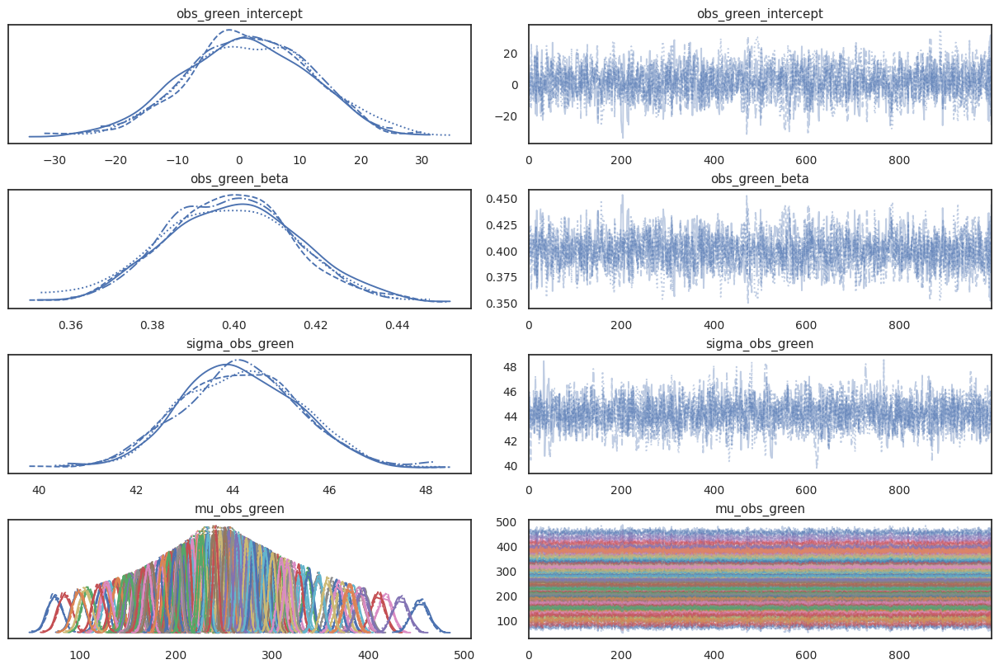

In [37]:
az.plot_trace(idata_model3.posterior);

In [38]:
summ = az.summary(idata_model3.posterior_predictive).reset_index(drop=True)
df_posterior_check = pd.concat([summ, dfm], axis=1)
df_posterior_check

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,day,total,obs_orange,obs_green,true_green
0,168.671,44.646,83.939,252.471,0.696,0.492,4107.0,4057.0,1.0,0,784,45,216,420
1,196.063,44.209,112.658,278.236,0.699,0.494,3996.0,3954.0,1.0,1,751,24,130,484
2,291.033,45.805,208.477,379.403,0.745,0.527,3777.0,3873.0,1.0,2,1052,26,334,723
3,215.398,44.680,132.605,299.737,0.726,0.520,3777.0,3814.0,1.0,3,937,46,163,534
4,267.273,44.979,187.077,354.398,0.713,0.504,3977.0,3851.0,1.0,4,857,21,341,667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,238.729,44.653,158.084,325.742,0.703,0.497,4032.0,3780.0,1.0,245,972,26,273,594
246,309.271,44.500,223.275,389.812,0.713,0.505,3894.0,3546.0,1.0,246,1030,13,287,771
247,203.451,45.289,120.912,287.888,0.729,0.517,3856.0,3756.0,1.0,247,755,26,152,505
248,300.333,44.529,222.138,390.162,0.730,0.516,3721.0,3467.0,1.0,248,1198,44,277,748


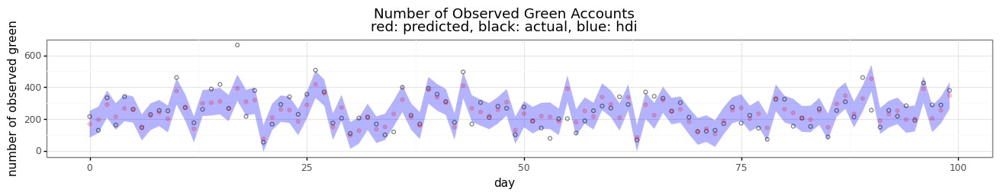

In [39]:
p =(ggplot(df_posterior_check[0:100], aes(x='day')) +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    geom_point(aes(y='obs_green'), alpha=0.5, color='black', fill='none') +
    geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(16, 2)) +
    labs(title=f'Number of Observed Green Accounts\nred: predicted, black: actual, blue: hdi', x='day', y='number of observed green')
   )
p.draw();

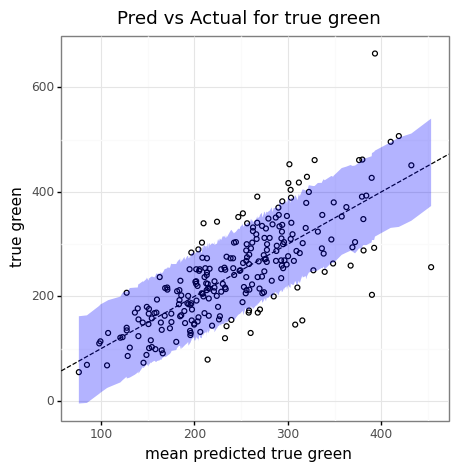

In [40]:
p =(ggplot(df_posterior_check, aes(x='mean', y='obs_green')) +
    geom_point(fill='none') +
    geom_abline(intercept=0, slope=1, linetype='dashed') +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    # geom_point(aes(y='obs_green'), alpha=0.5, color='black') +
    # geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(5, 5)) +
    labs(title=f'Pred vs Actual for true green', x='mean predicted true green', y='true green')
   )
p.draw();

In [41]:
az.loo(idata_model3)

Computed from 4000 by 250 log-likelihood matrix

         Estimate       SE
elpd_loo -1414.44    29.16
p_loo        7.70        -

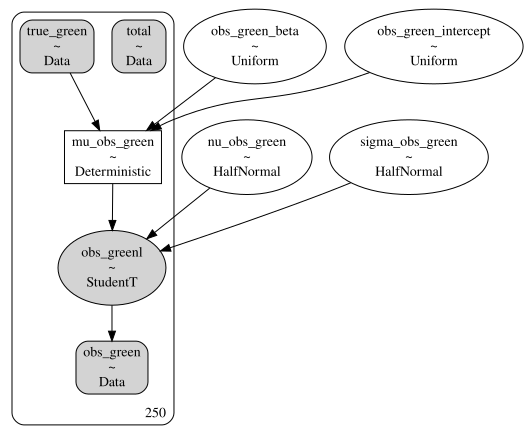

In [42]:
with pm.Model() as model4:
    # data
    obs_total = pm.Data('total', dfm['total'].values)
    obs_green = pm.Data('obs_green', dfm['obs_green'].values)
    true_green = pm.Data('true_green', dfm['true_green'].values)
    
    # # Priors for linear relationship between true green and total 
    # mu_green_intercept = pm.Uniform('mu_green_intercept', -0.5, 0.5)
    # mu_green_beta = pm.Uniform('mu_green_beta', -2, 2)    
    # sigma_green = pm.HalfNormal('sigma_green', 3)
    # # Linear relationship between true green and total
    # mu_green = pm.Deterministic('mu_green', mu_green_intercept + mu_green_beta * obs_total)
    # true_greenl = pm.Normal('true_greenl', mu_green, sigma_green, observed=true_green)
    
    # Priors for relationship between obs_green and true_green
    obs_green_intercept = pm.Uniform('obs_green_intercept', -200, 200)
    obs_green_beta = pm.Uniform('obs_green_beta', -2, 2)
    sigma_obs_green = pm.HalfNormal('sigma_obs_green', 1)
    nu_obs_green = pm.HalfNormal('nu_obs_green', 10)
    # Process
    mu_obs_green = pm.Deterministic('mu_obs_green', obs_green_intercept + obs_green_beta * true_green)
    obs_greenl = pm.StudentT('obs_greenl', nu_obs_green, mu_obs_green, sigma_obs_green, observed=obs_green)
    
    prior = pm.sample_prior_predictive()
    idata_model4 = az.from_pymc3(prior=prior)
    # trace = pm.sample()
    # idata_model1 = az.from_pymc3(trace=trace)
pm.model_to_graphviz(model4) 

In [43]:
with model4:
    trace = pm.sample(return_inferencedata=False)
    post = pm.sample_posterior_predictive(trace)
    idata_model4.extend(az.from_pymc3(trace=trace, posterior_predictive=post))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu_obs_green, sigma_obs_green, obs_green_beta, obs_green_intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


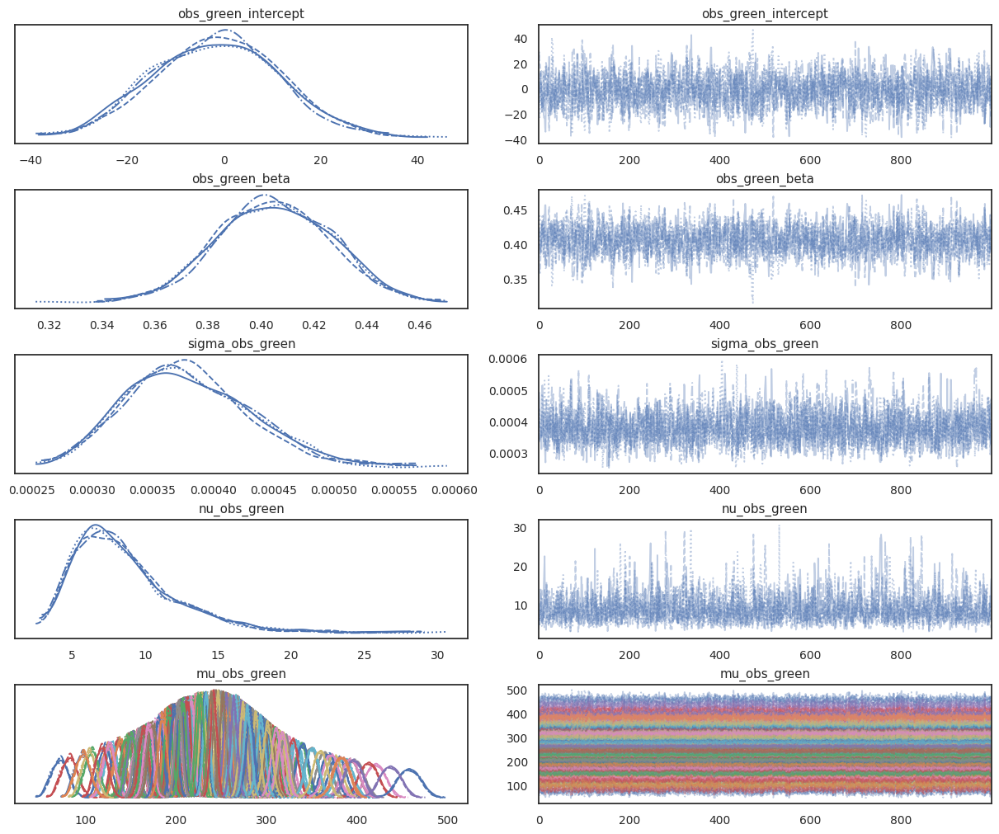

In [44]:
az.plot_trace(idata_model4.posterior);

In [45]:
az.loo(idata_model4)

Computed from 4000 by 250 log-likelihood matrix

         Estimate       SE
elpd_loo -1378.25    13.95
p_loo        4.16        -

In [46]:
az_compare = az.compare({'model3': idata_model3, 'model4': idata_model4})
az_compare

/home/david/mambaforge/envs/bmcp/lib/python3.9/site-packages/arviz/stats/stats.py:145: UserWarning: The default method used to estimate the weights for each model,has changed from BB-pseudo-BMA to stacking


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
model4,0,-1378.252600,4.158174,0.000000,0.971845,13.951484,0.000000,False,log
model3,1,-1414.439639,7.697283,36.187038,0.028155,29.158295,16.179606,False,log


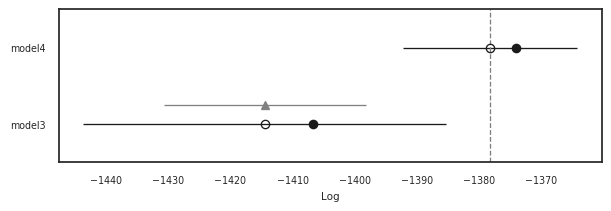

In [47]:
az.plot_compare(az_compare)
plt.show();

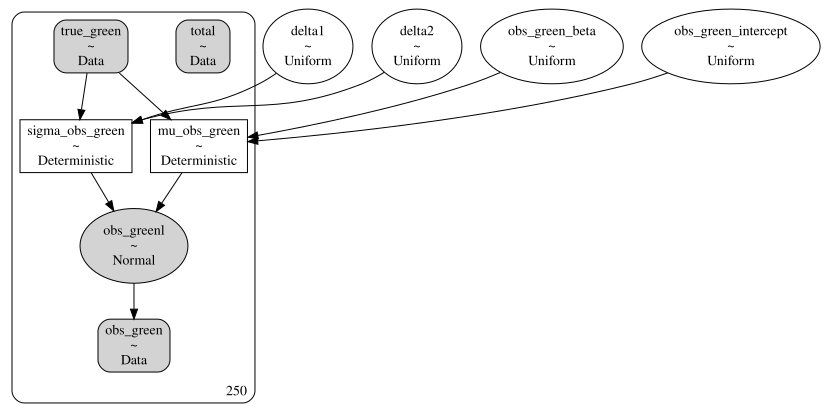

In [48]:
with pm.Model() as model5:
    # data
    obs_total = pm.Data('total', dfm['total'].values)
    obs_green = pm.Data('obs_green', dfm['obs_green'].values)
    true_green = pm.Data('true_green', dfm['true_green'].values)
    
    # # Priors for linear relationship between true green and total 
    # mu_green_intercept = pm.Uniform('mu_green_intercept', -0.5, 0.5)
    # mu_green_beta = pm.Uniform('mu_green_beta', -2, 2)    
    # sigma_green = pm.HalfNormal('sigma_green', 3)
    # # Linear relationship between true green and total
    # mu_green = pm.Deterministic('mu_green', mu_green_intercept + mu_green_beta * obs_total)
    # true_greenl = pm.Normal('true_greenl', mu_green, sigma_green, observed=true_green)
    
    # Priors for relationship between obs_green and true_green
    obs_green_intercept = pm.Uniform('obs_green_intercept', -200, 200)
    obs_green_beta = pm.Uniform('obs_green_beta', -2, 2)
    # sigma_obs_green = pm.HalfNormal('sigma_obs_green', 3)
    # nu_obs_green = pm.HalfNormal('nu_obs_green', 10)
    
    # Varying variance
    delta1 = pm.Uniform('delta1', -30, 30)
    delta2 = pm.Uniform('delta2', 0, 1.0)
    
    # Process
    sigma_obs_green = pm.Deterministic('sigma_obs_green', delta1 + delta2 * true_green)   
    mu_obs_green = pm.Deterministic('mu_obs_green', obs_green_intercept + obs_green_beta * true_green)
    obs_greenl = pm.Normal('obs_greenl', mu_obs_green, sigma_obs_green, observed=obs_green)
    
    prior = pm.sample_prior_predictive()
    idata_model5 = az.from_pymc3(prior=prior)
    # trace = pm.sample()
    # idata_model1 = az.from_pymc3(trace=trace)
pm.model_to_graphviz(model5)

In [49]:
with model5:
    trace = pm.sample(tune=2000, return_inferencedata=False)
    post = pm.sample_posterior_predictive(trace)
    idata_model5.extend(az.from_pymc3(trace=trace, posterior_predictive=post))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [delta2, delta1, obs_green_beta, obs_green_intercept]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 6 seconds.


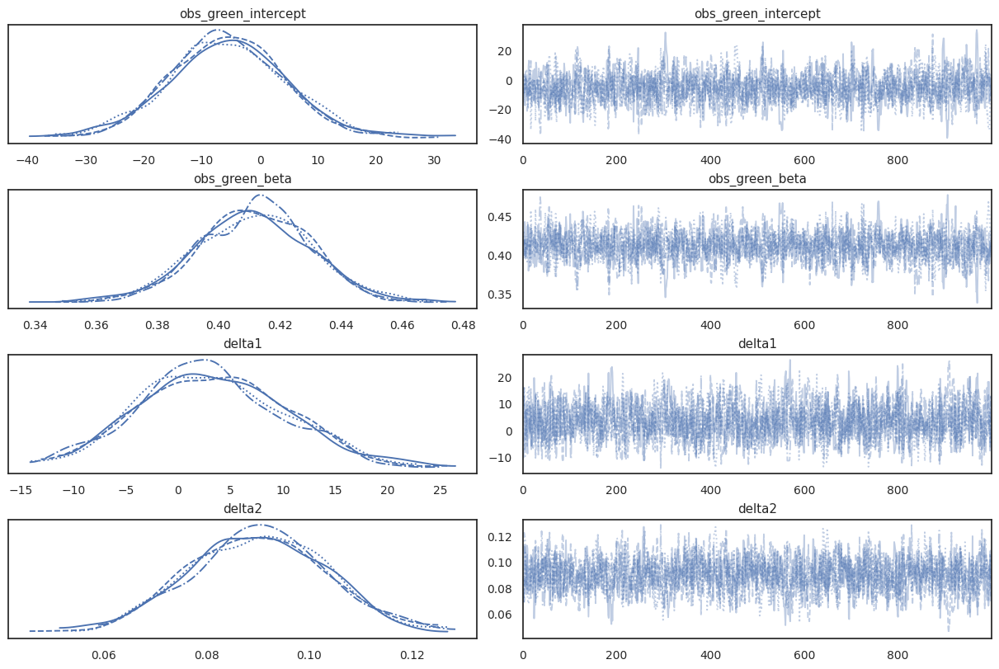

In [50]:
az.plot_trace(idata_model5.posterior, var_names=['obs_green_intercept', 'obs_green_beta', 'delta1', 'delta2']);

In [51]:
az_compare = az.compare({'model3': idata_model3, 'model4': idata_model4, 'model5': idata_model5})
az_compare

/home/david/mambaforge/envs/bmcp/lib/python3.9/site-packages/arviz/stats/stats.py:145: UserWarning: The default method used to estimate the weights for each model,has changed from BB-pseudo-BMA to stacking


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
model5,0,-1359.859260,4.055368,0.000000,9.419993e-01,12.055796,0.000000,False,log
model4,1,-1378.252600,4.158174,18.393340,1.680797e-14,13.951484,5.659770,False,log
model3,2,-1414.439639,7.697283,54.580379,5.800074e-02,29.158295,19.948637,False,log


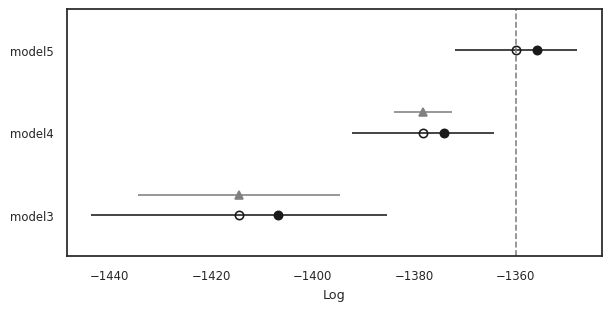

In [52]:
az.plot_compare(az_compare)
plt.show();

In [53]:
summ = az.summary(idata_model5.posterior_predictive).reset_index(drop=True)
df_posterior_check = pd.concat([summ, dfm], axis=1)
df_posterior_check

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,day,total,obs_orange,obs_green,true_green
0,166.664,41.368,87.501,241.119,0.659,0.466,3942.0,3893.0,1.0,0,784,45,216,420
1,193.622,46.668,105.919,280.936,0.739,0.524,3987.0,3810.0,1.0,1,751,24,130,484
2,291.502,69.700,164.350,420.582,1.110,0.785,3941.0,4003.0,1.0,2,1052,26,334,723
3,213.807,51.915,113.640,310.289,0.833,0.589,3894.0,3821.0,1.0,3,937,46,163,534
4,270.122,63.633,147.427,383.757,1.024,0.726,3866.0,3849.0,1.0,4,857,21,341,667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,238.248,56.584,134.318,349.430,0.899,0.636,3960.0,3814.0,1.0,245,972,26,273,594
246,310.687,72.883,182.713,457.061,1.185,0.848,3797.0,3851.0,1.0,246,1030,13,287,771
247,200.915,48.817,108.724,293.739,0.809,0.572,3650.0,3657.0,1.0,247,755,26,152,505
248,302.410,72.048,170.427,440.110,1.164,0.824,3812.0,3936.0,1.0,248,1198,44,277,748


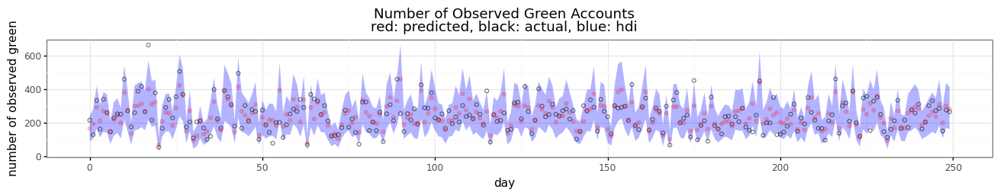

In [54]:
p =(ggplot(df_posterior_check, aes(x='day')) +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    geom_point(aes(y='obs_green'), alpha=0.5, color='black', fill='none') +
    geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(16, 2)) +
    labs(title=f'Number of Observed Green Accounts\nred: predicted, black: actual, blue: hdi', x='day', y='number of observed green')
   )
p.draw();

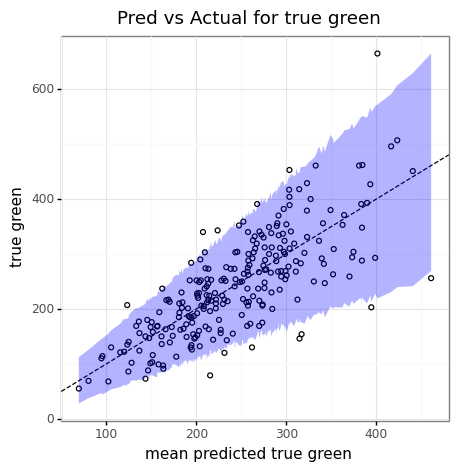

In [55]:
p =(ggplot(df_posterior_check, aes(x='mean', y='obs_green')) +
    geom_point(fill='none') +
    geom_abline(intercept=0, slope=1, linetype='dashed') +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    # geom_point(aes(y='obs_green'), alpha=0.5, color='black') +
    # geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(5, 5)) +
    labs(title=f'Pred vs Actual for true green', x='mean predicted true green', y='true green')
   )
p.draw();

/home/david/mambaforge/envs/bmcp/lib/python3.9/site-packages/pymc3/distributions/continuous.py:514: RuntimeWarning: divide by zero encountered in power
/home/david/mambaforge/envs/bmcp/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1094: RuntimeWarning: invalid value encountered in add


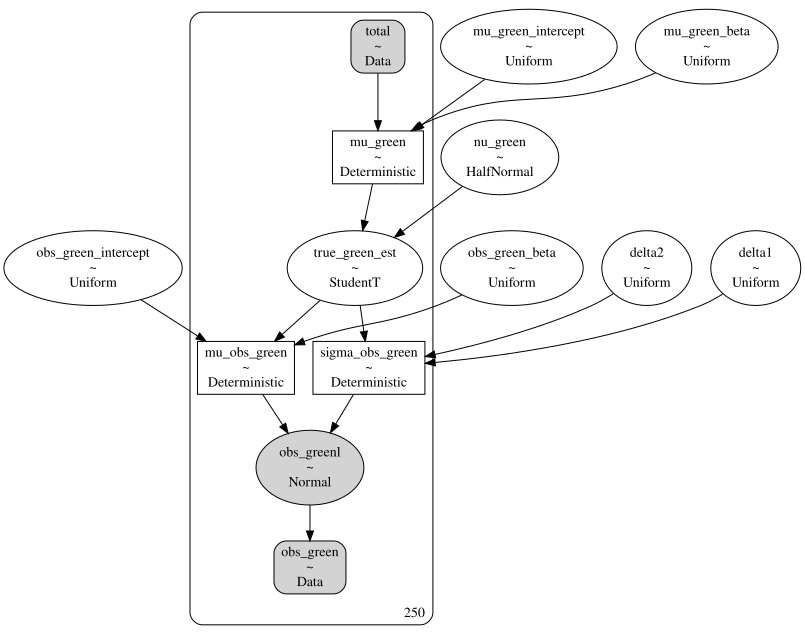

In [131]:
with pm.Model() as model6:
    # data
    obs_total = pm.Data('total', dfm['total'].values)
    obs_green = pm.Data('obs_green', dfm['obs_green'].values)
    # obs_total = pm.Data('total', dfm['total'].values)
    # obs_green = pm.Data('obs_green', dfm['obs_green'].values)
    # true_green = pm.Data('true_green', dfm_std['true_green'].values)
    
    # Priors for linear relationship between true green and total 
    mu_green_intercept = pm.Uniform('mu_green_intercept', -20, 20)
    mu_green_beta = pm.Uniform('mu_green_beta', 0, 3)    
    # sigma_green = pm.HalfNormal('sigma_green', 1)
    nu_green = pm.HalfNormal('nu_green', 1)
    # Linear relationship between true green and total
    mu_green = pm.Deterministic('mu_green', mu_green_intercept + mu_green_beta * obs_total)
    true_green_est = pm.StudentT('true_green_est', nu_green, mu_green, 0.00001, shape=obs_total.shape[0].eval())
    
    # Priors for relationship between obs_green and true_green
    obs_green_intercept = pm.Uniform('obs_green_intercept', -200, 200)
    obs_green_beta = pm.Uniform('obs_green_beta', -2, 2)
    # sigma_obs_green = pm.HalfNormal('sigma_obs_green', 3)
    # nu_obs_green = pm.HalfNormal('nu_obs_green', 10)
    
    # Varying variance
    delta1 = pm.Uniform('delta1', -50, 50)
    delta2 = pm.Uniform('delta2', 0, 0.2)
    
    # Process
    sigma_obs_green = pm.Deterministic('sigma_obs_green', delta1 + delta2 * pm.math.clip(true_green_est, 0.0000001, np.inf))   
    mu_obs_green = pm.Deterministic('mu_obs_green', obs_green_intercept + obs_green_beta * true_green_est)
    obs_greenl = pm.Normal('obs_greenl', mu_obs_green, sigma_obs_green, observed=obs_green)
    
    prior = pm.sample_prior_predictive()
    idata_model6 = az.from_pymc3(prior=prior)
    # trace = pm.sample()
    # idata_model1 = az.from_pymc3(trace=trace)
pm.model_to_graphviz(model6)

In [132]:
with model6:
    trace = pm.sample(tune=2000, return_inferencedata=False)
    post = pm.sample_posterior_predictive(trace)
    idata_model6.extend(az.from_pymc3(trace=trace, posterior_predictive=post))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [delta2, delta1, obs_green_beta, obs_green_intercept, true_green_est, nu_green, mu_green_beta, mu_green_intercept]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 21 seconds.
There were 156 divergences after tuning. Increase `target_accept` or reparameterize.
There were 303 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.659611221986699, but should be close to 0.8. Try to increase the number of tuning steps.
There were 221 divergences after tuning. Increase `target_accept` or reparameterize.
There were 175 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


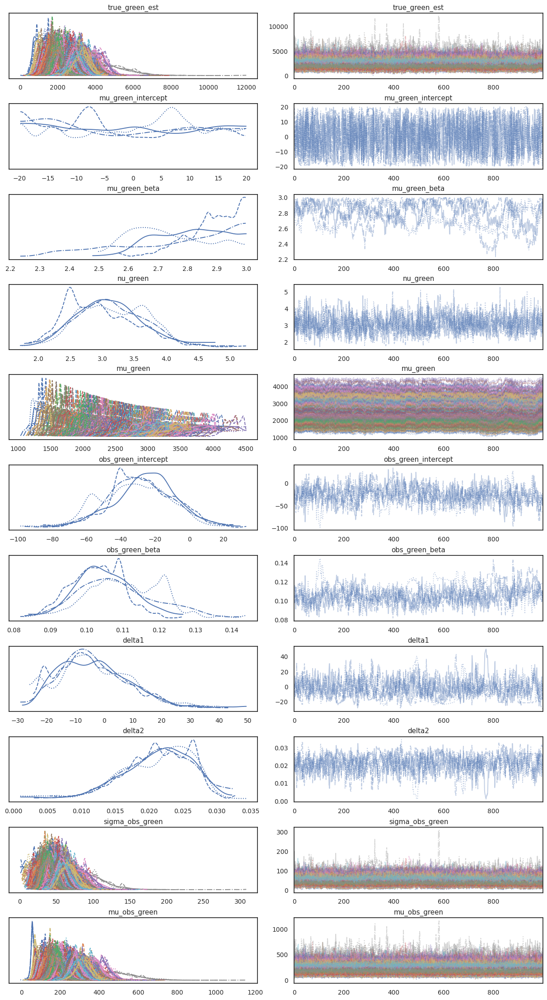

In [133]:
az.plot_trace(idata_model6.posterior);

In [134]:
summ = az.summary(idata_model6.posterior_predictive).reset_index(drop=True)
df_posterior_check = pd.concat([summ, dfm], axis=1)
df_posterior_check

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,day,total,obs_orange,obs_green,true_green
0,210.139,54.493,103.472,309.416,0.990,0.745,3109.0,2647.0,1.0,0,784,45,216,420
1,163.388,47.574,85.370,260.618,1.094,0.799,2050.0,2520.0,1.0,1,751,24,130,484
2,301.866,70.956,173.131,438.636,1.478,1.074,2343.0,2689.0,1.0,2,1052,26,334,723
3,215.779,61.551,106.990,333.737,1.382,1.021,2035.0,2509.0,1.0,3,937,46,163,534
4,278.790,70.458,150.774,415.740,1.620,1.215,2057.0,2507.0,1.0,4,857,21,341,667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,265.513,64.184,150.816,392.234,1.296,0.927,2465.0,3423.0,1.0,245,972,26,273,594
246,280.048,67.009,160.870,411.882,1.316,0.954,2662.0,2531.0,1.0,246,1030,13,287,771
247,178.020,48.665,88.993,268.948,0.931,0.674,2800.0,3683.0,1.0,247,755,26,152,505
248,314.005,75.137,165.246,446.540,1.774,1.257,1804.0,2570.0,1.0,248,1198,44,277,748


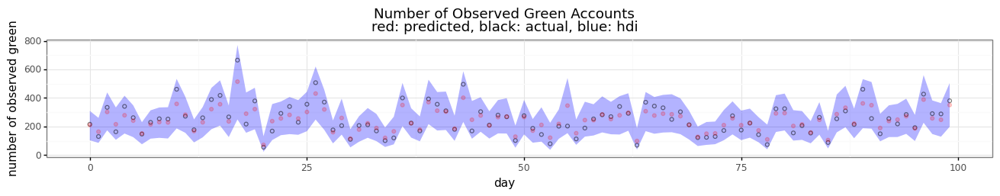

In [135]:
p =(ggplot(df_posterior_check[0:100], aes(x='day')) +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    geom_point(aes(y='obs_green'), alpha=0.5, color='black', fill='none') +
    geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(16, 2)) +
    labs(title=f'Number of Observed Green Accounts\nred: predicted, black: actual, blue: hdi', x='day', y='number of observed green')
   )
p.draw();

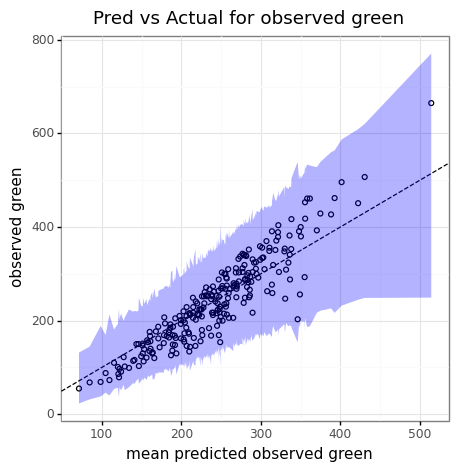

In [136]:
p =(ggplot(df_posterior_check, aes(x='mean', y='obs_green')) +
    geom_point(fill='none') +
    geom_abline(intercept=0, slope=1, linetype='dashed') +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    # geom_point(aes(y='obs_green'), alpha=0.5, color='black') +
    # geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(5, 5)) +
    labs(title=f'Pred vs Actual for observed green', x='mean predicted observed green', y='observed green')
   )
p.draw();

In [137]:
idata_model6

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> constant_data

In [138]:
summ = az.summary(idata_model6.posterior['true_green_est']).reset_index(drop=True)
# summ
df_posterior_check = pd.concat([summ, dfm], axis=1)[['mean', 'sd','hdi_3%', 'hdi_97%', 'mcse_sd', 'ess_bulk', 'ess_tail', 'r_hat', 'day', 'total', 'obs_green', 'true_green']]
df_posterior_check

,mean,sd,hdi_3%,hdi_97%,mcse_sd,ess_bulk,ess_tail,r_hat,day,total,obs_green,true_green
0,2245.523,297.032,1616.591,2754.131,13.207,228.0,280.0,1.01,0,784,216,420
1,1796.535,322.245,1249.771,2421.435,13.555,278.0,1783.0,1.01,1,751,130,484
2,3097.707,352.035,2520.386,3832.416,26.431,82.0,305.0,1.05,2,1052,334,723
3,2298.523,398.556,1572.101,3017.088,24.606,171.0,918.0,1.03,3,937,163,534
4,2888.027,384.724,2263.328,3634.174,11.894,391.0,983.0,1.01,4,857,341,667
...,...,...,...,...,...,...,...,...,...,...,...,...
245,2759.649,318.356,2113.048,3286.340,18.568,142.0,274.0,1.03,245,972,273,594
246,2905.028,334.411,2255.893,3501.591,18.226,159.0,369.0,1.02,246,1030,287,771
247,1947.920,305.046,1404.508,2496.580,13.640,247.0,726.0,1.01,247,755,152,505
248,3224.346,398.302,2497.945,4008.920,21.635,180.0,354.0,1.02,248,1198,277,748


In [139]:
# df_posterior_check[['mean', 'sd', 'hdi_3%', 'hdi_97%',  = 

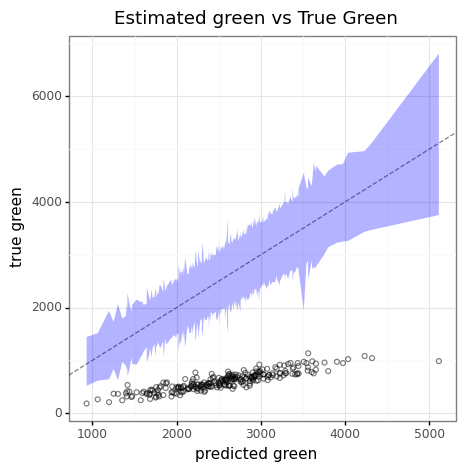

In [140]:
p =(ggplot(df_posterior_check, aes(x='mean', y='true_green')) +
    geom_point(fill='none', alpha=0.5) +
    geom_abline(intercept=0, slope=1, linetype='dashed', alpha=0.5) +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    # geom_point(aes(y='obs_green'), alpha=0.5, color='black') +
    # geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(5, 5)) +
    labs(title=f'Estimated green vs True Green', x='predicted green', y='true green')
   )
p.draw();

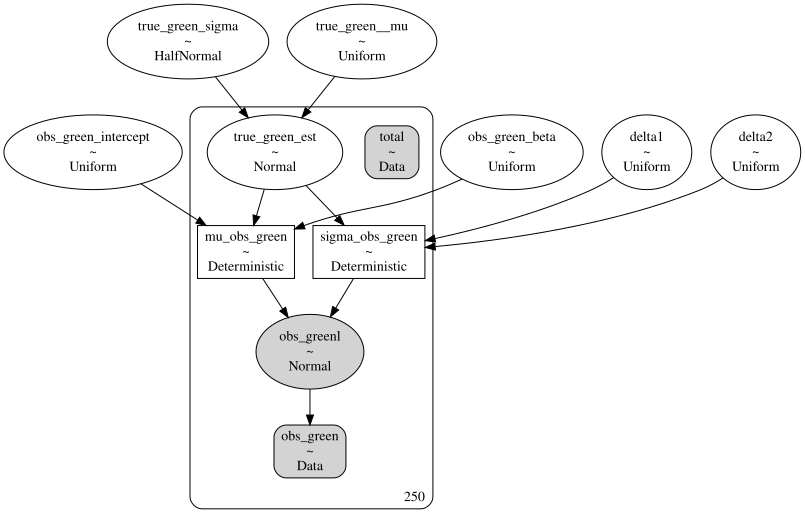

In [227]:
with pm.Model() as model7:
    # data
    obs_total = pm.Data('total', dfm['total'].values)
    obs_green = pm.Data('obs_green', dfm['obs_green'].values)
    # obs_total = pm.Data('total', dfm['total'].values)
    # obs_green = pm.Data('obs_green', dfm['obs_green'].values)
    # true_green = pm.Data('true_green', dfm_std['true_green'].values)
    
    # Priors for linear relationship between true green and total 
    # mu_green_intercept = pm.Uniform('mu_green_intercept', -20, 20)
    # mu_green_beta = pm.Uniform('mu_green_beta', 0, 3)    
    # # sigma_green = pm.HalfNormal('sigma_green', 1)
    # nu_green = pm.HalfNormal('nu_green', 1)
    # # Linear relationship between true green and total
    # mu_green = pm.Deterministic('mu_green', mu_green_intercept + mu_green_beta * obs_total)
    # true_green_est = pm.StudentT('true_green_est', nu_green, mu_green, 0.00001, shape=obs_total.shape[0].eval())
    
    true_green_mu = pm.Uniform('true_green__mu', 0, 1000)
    true_green_sigma = pm.HalfNormal('true_green_sigma', 400)
    true_green_est = pm.Normal('true_green_est', true_green_mu, true_green_sigma, shape=obs_total.shape[0].eval())
    
    # Priors for relationship between obs_green and true_green
    obs_green_intercept = pm.Uniform('obs_green_intercept', -200, 200)
    obs_green_beta = pm.Uniform('obs_green_beta', -2, 2)
    # sigma_obs_green = pm.HalfNormal('sigma_obs_green', 3)
    # nu_obs_green = pm.HalfNormal('nu_obs_green', 10)
    
    # Varying variance
    delta1 = pm.Uniform('delta1', -30, 30)
    delta2 = pm.Uniform('delta2', 0, 1.0)
    
    # Process
    sigma_obs_green = pm.Deterministic('sigma_obs_green', delta1 + delta2 * pm.math.clip(true_green_est, 0.0000001, np.inf))   
    mu_obs_green = pm.Deterministic('mu_obs_green', obs_green_intercept + obs_green_beta * true_green_est)
    obs_greenl = pm.Normal('obs_greenl', mu_obs_green, sigma_obs_green, observed=obs_green)
    
    prior = pm.sample_prior_predictive()
    idata_model7 = az.from_pymc3(prior=prior)
    # trace = pm.sample()
    # idata_model1 = az.from_pymc3(trace=trace)
pm.model_to_graphviz(model7)

In [228]:
with model7:
    trace = pm.sample(tune=2000, return_inferencedata=False)
    post = pm.sample_posterior_predictive(trace)
    idata_model7.extend(az.from_pymc3(trace=trace, posterior_predictive=post))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [delta2, delta1, obs_green_beta, obs_green_intercept, true_green_est, true_green_sigma, true_green__mu]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 120 seconds.
There were 166 divergences after tuning. Increase `target_accept` or reparameterize.
There were 30 divergences after tuning. Increase `target_accept` or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
There were 78 divergences after tuning. Increase `target_accept` or reparameterize.
There were 109 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6870944104552545, but should be close to 0.8. Try to increase the number of tuning steps.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


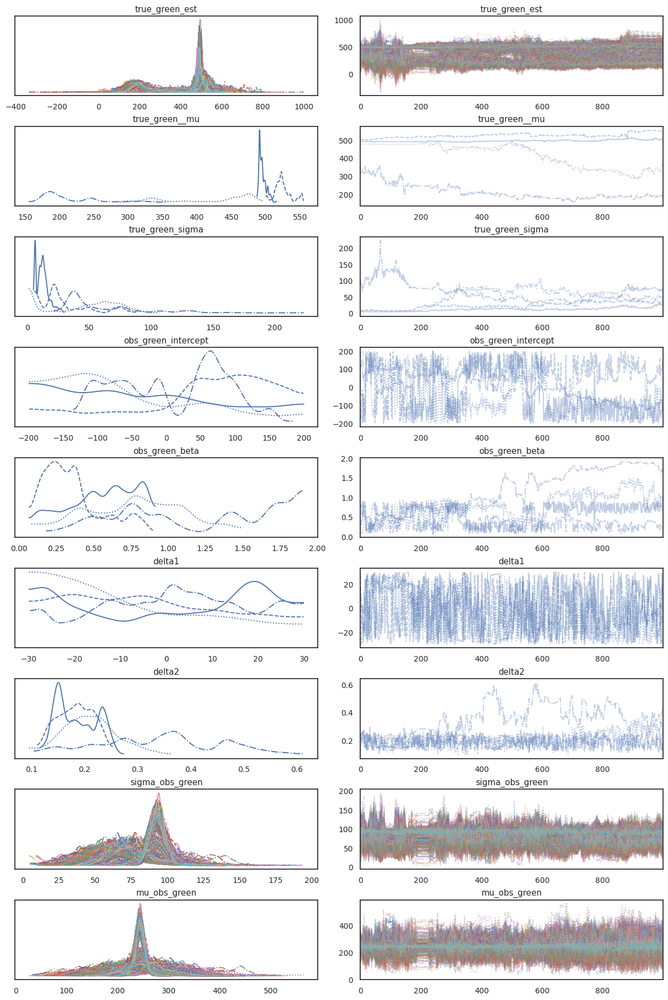

In [229]:
az.plot_trace(idata_model7.posterior);

In [230]:
summ = az.summary(idata_model7.posterior_predictive).reset_index(drop=True)
df_posterior_check = pd.concat([summ, dfm], axis=1)
df_posterior_check

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,day,total,obs_orange,obs_green,true_green
0,236.280,86.545,65.357,389.974,1.715,1.364,2536.0,2854.0,1.00,0,784,45,216,420
1,222.394,89.373,71.689,395.777,9.734,6.907,89.0,2855.0,1.04,1,751,24,130,484
2,258.857,94.097,81.710,432.593,5.955,4.216,253.0,2682.0,1.02,2,1052,26,334,723
3,230.652,89.094,75.528,402.797,5.238,4.210,319.0,2771.0,1.02,3,937,46,163,534
4,259.405,95.875,89.663,448.865,7.474,5.294,162.0,2706.0,1.02,4,857,21,341,667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,248.637,90.076,87.228,426.957,1.871,1.406,2341.0,3376.0,1.00,245,972,26,273,594
246,245.821,90.559,77.686,418.044,1.904,1.347,2244.0,3375.0,1.00,246,1030,13,287,771
247,226.005,89.897,73.368,402.156,4.733,3.700,394.0,3719.0,1.02,247,755,26,152,505
248,247.791,93.095,87.971,437.447,1.715,1.213,2957.0,2614.0,1.00,248,1198,44,277,748


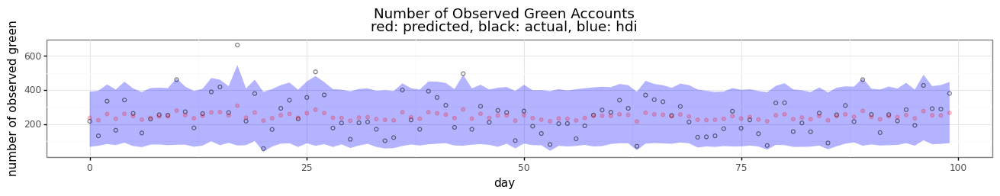

In [231]:
p =(ggplot(df_posterior_check[0:100], aes(x='day')) +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    geom_point(aes(y='obs_green'), alpha=0.5, color='black', fill='none') +
    geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(16, 2)) +
    labs(title=f'Number of Observed Green Accounts\nred: predicted, black: actual, blue: hdi', x='day', y='number of observed green')
   )
p.draw();

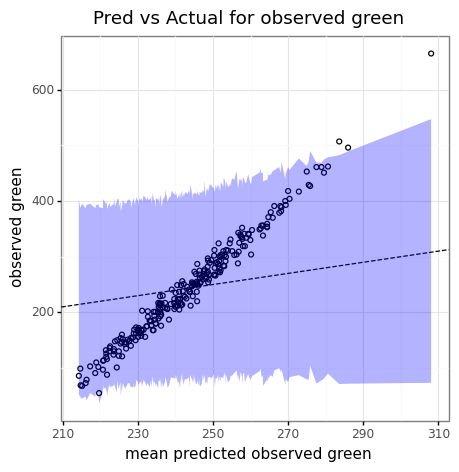

In [232]:
p =(ggplot(df_posterior_check, aes(x='mean', y='obs_green')) +
    geom_point(fill='none') +
    geom_abline(intercept=0, slope=1, linetype='dashed') +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    # geom_point(aes(y='obs_green'), alpha=0.5, color='black') +
    # geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(5, 5)) +
    labs(title=f'Pred vs Actual for observed green', x='mean predicted observed green', y='observed green')
   )
p.draw();

In [233]:
summ = az.summary(idata_model7.posterior['true_green_est']).reset_index(drop=True)
# summ
df_posterior_check = pd.concat([summ, dfm], axis=1)[['mean', 'sd','hdi_3%', 'hdi_97%', 'mcse_sd', 'ess_bulk', 'ess_tail', 'r_hat', 'day', 'total', 'obs_green', 'true_green']]
df_posterior_check

,mean,sd,hdi_3%,hdi_97%,mcse_sd,ess_bulk,ess_tail,r_hat,day,total,obs_green,true_green
0,406.457,132.923,158.565,554.568,47.412,6.0,24.0,1.97,0,784,216,420
1,392.463,156.776,109.267,568.275,56.571,5.0,22.0,2.26,1,751,130,484
2,429.296,119.371,183.786,572.060,42.180,6.0,20.0,1.89,2,1052,334,723
3,399.666,148.636,118.889,568.184,53.205,5.0,19.0,2.07,3,937,163,534
4,429.801,123.835,169.560,568.523,42.613,6.0,23.0,1.82,4,857,341,667
...,...,...,...,...,...,...,...,...,...,...,...,...
245,417.689,128.520,166.357,559.275,45.445,6.0,20.0,1.89,245,972,273,594
246,417.380,129.132,178.159,582.501,46.435,5.0,16.0,2.36,246,1030,287,771
247,395.475,150.851,127.717,581.811,54.231,5.0,18.0,2.20,247,755,152,505
248,415.469,125.085,171.294,552.981,44.903,5.0,21.0,2.10,248,1198,277,748


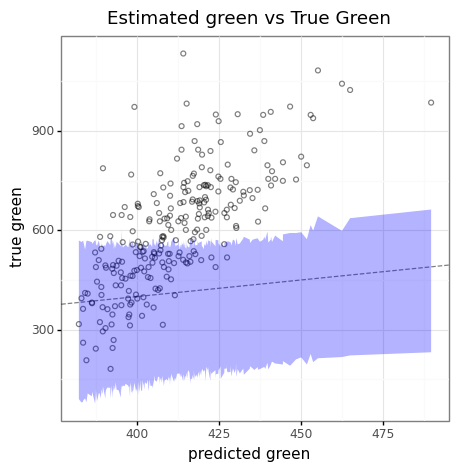

In [234]:
p =(ggplot(df_posterior_check, aes(x='mean', y='true_green')) +
    geom_point(fill='none', alpha=0.5) +
    geom_abline(intercept=0, slope=1, linetype='dashed', alpha=0.5) +
    geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.3, fill='blue') +
    # geom_point(aes(y='obs_green'), alpha=0.5, color='black') +
    # geom_point(aes(y='mean'), color='red', alpha=0.2) +
    theme(figure_size=(5, 5)) +
    labs(title=f'Estimated green vs True Green', x='predicted green', y='true green')
   )
p.draw();